In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from sklearn.cluster import AffinityPropagation



In [2]:
!pip install seaborn yellowbrick


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [3]:
!pip install seaborn

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [4]:
# Load the dataset
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/Wholesale customers data.csv")

print(data.head())
# Data Analysis
# Check basic statistics
print(data.describe())



   Channel  Region  Fresh  Milk  Grocery  Frozen  Detergents_Paper  Delicassen
0        2       3  12669  9656     7561     214              2674        1338
1        2       3   7057  9810     9568    1762              3293        1776
2        2       3   6353  8808     7684    2405              3516        7844
3        1       3  13265  1196     4221    6404               507        1788
4        2       3  22615  5410     7198    3915              1777        5185
          Channel      Region          Fresh          Milk       Grocery  \
count  440.000000  440.000000     440.000000    440.000000    440.000000   
mean     1.322727    2.543182   12000.297727   5796.265909   7951.277273   
std      0.468052    0.774272   12647.328865   7380.377175   9503.162829   
min      1.000000    1.000000       3.000000     55.000000      3.000000   
25%      1.000000    2.000000    3127.750000   1533.000000   2153.000000   
50%      1.000000    3.000000    8504.000000   3627.000000   4755.5000

StopIteration: 

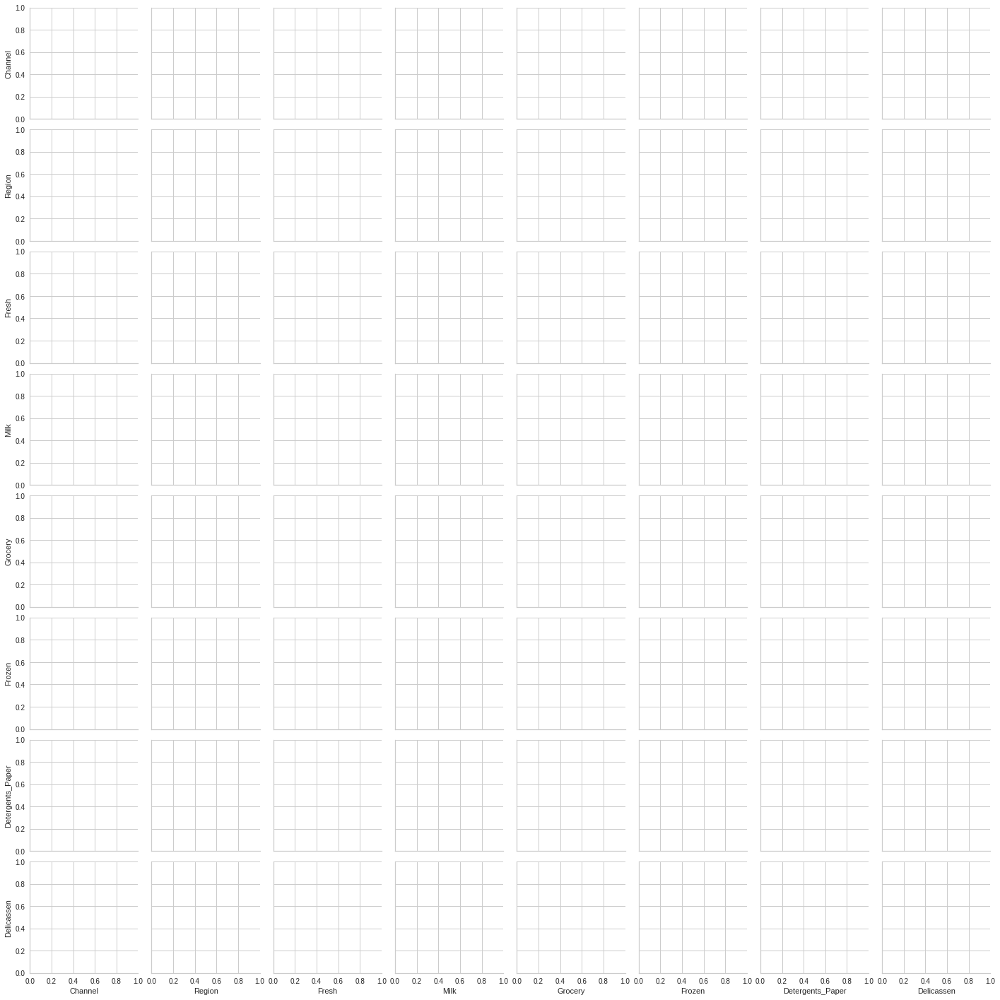

In [9]:
# Data Visualization
# Pair plot for numeric features
sns.pairplot(data)
plt.show()



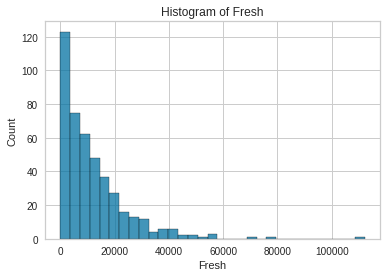

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
sns.histplot(data['Fresh'])

plt.xlabel('Fresh')
plt.ylabel('Count')
plt.title('Histogram of Fresh')

# Show the plot
plt.show()

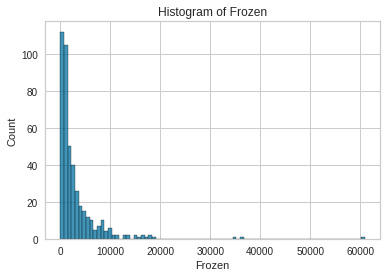

In [10]:
# Assuming df is your DataFrame
sns.histplot(data['Frozen'])

plt.xlabel('Frozen')
plt.ylabel('Count')
plt.title('Histogram of Frozen')

# Show the plot
plt.show()

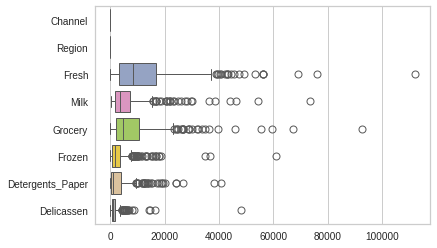

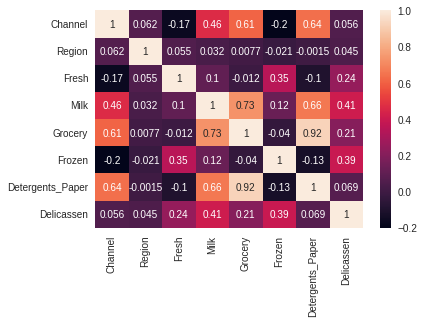

StopIteration: 

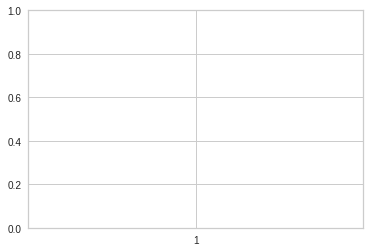

In [12]:
# Box plots for features
sns.boxplot(data=data, orient="h", palette="Set2")
plt.show()

# Correlation matrix
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

# Categorical Features Analysis
# Countplot for 'Channel' and 'Region'
sns.countplot(data=data, x="Channel")
plt.show()
sns.countplot(data=data, x="Region")
plt.show()






/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set 

TypeError: MathTextParser.parse() got an unexpected keyword argument 'antialiased'

<Figure size 432x288 with 2 Axes>

/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score for K-Means: 0.3425521614309284


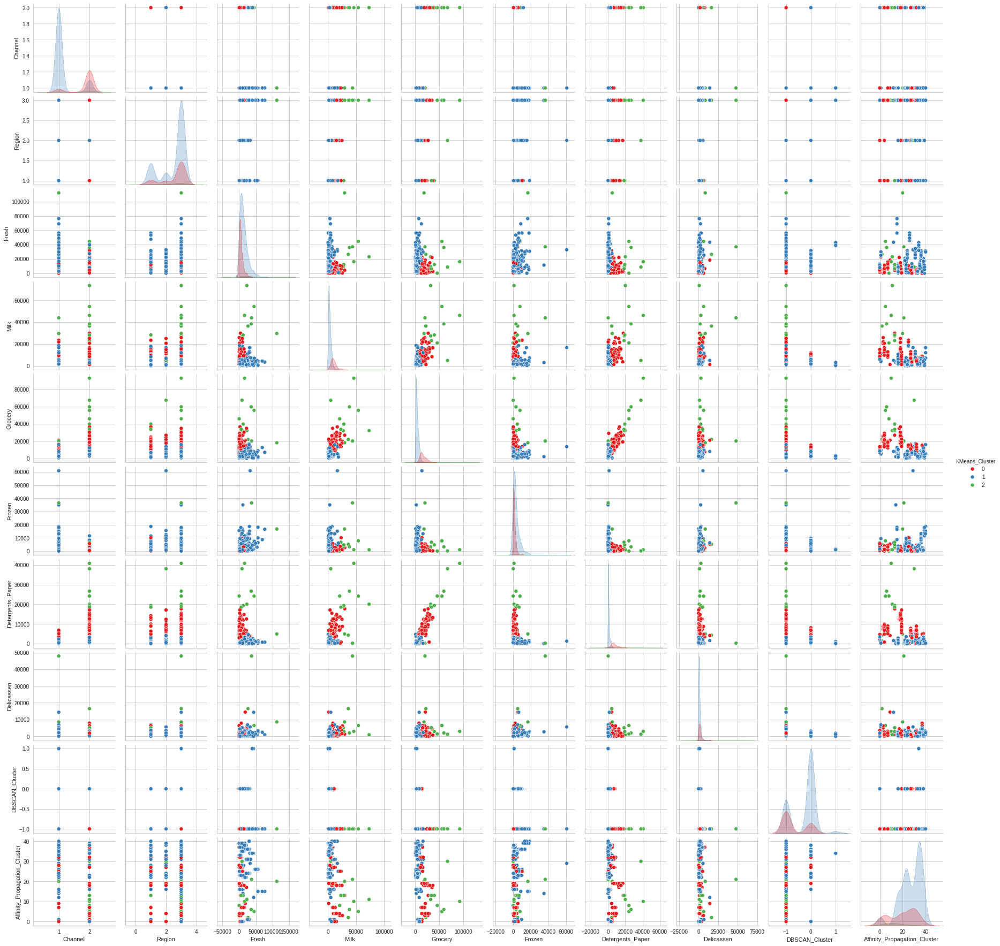

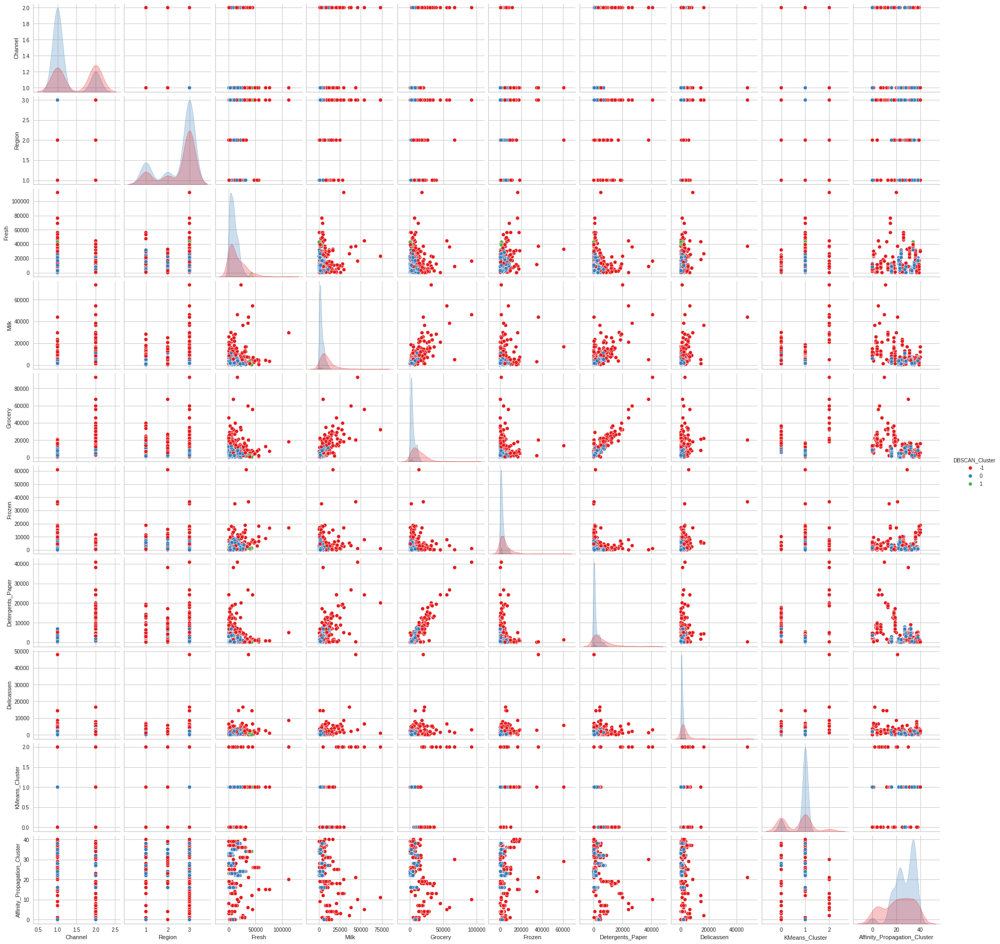

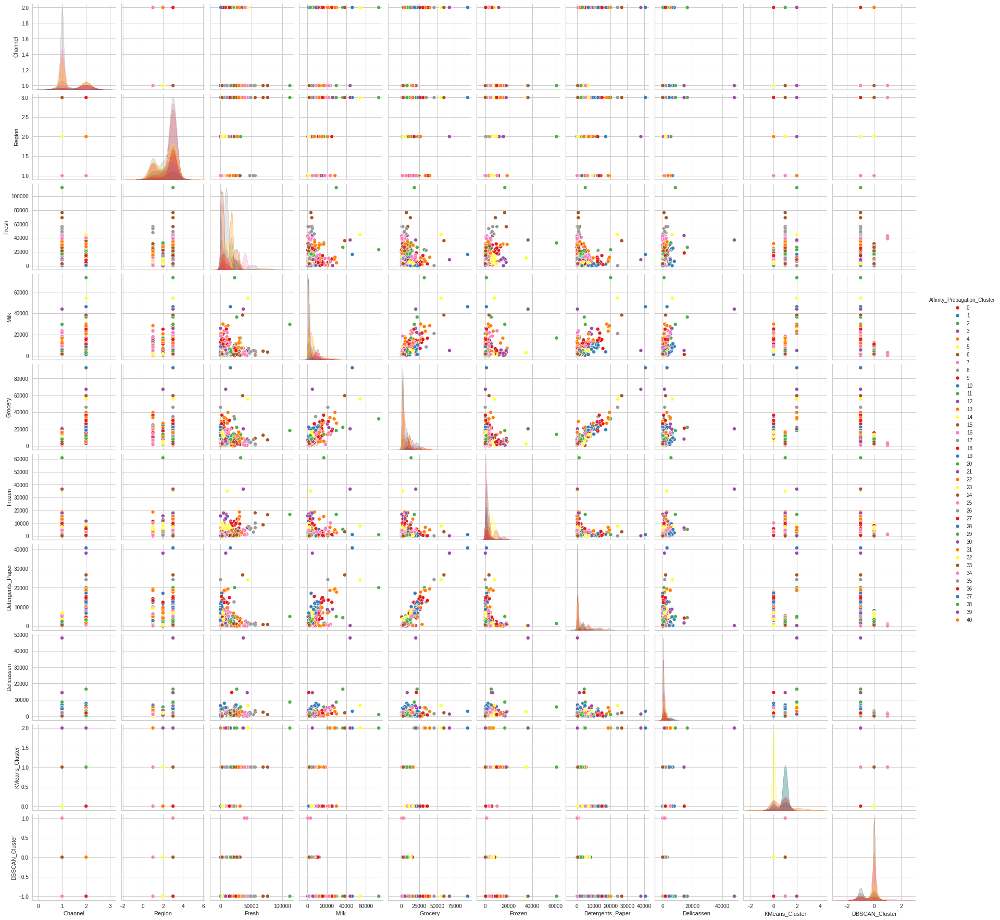

In [15]:
# Clustering
# Feature selection and scaling
selected_features = data[['Fresh', 'Milk', 'Grocery', 'Frozen', 'Detergents_Paper', 'Delicassen']]
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_features)

# Elbow method to find the optimal number of clusters for K-Means
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 10))
visualizer.fit(scaled_data)
visualizer.show()

# K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
data['KMeans_Cluster'] = kmeans.fit_predict(scaled_data)

# DBSCAN
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(scaled_data)
distances, indices = nbrs.kneighbors(scaled_data)
distances = np.sort(distances, axis=0)[:, 1]
db = DBSCAN(eps=0.5, min_samples=5)
data['DBSCAN_Cluster'] = db.fit_predict(scaled_data)

# Affinity Propagation
affinity_propagation = AffinityPropagation()
data['Affinity_Propagation_Cluster'] = affinity_propagation.fit_predict(scaled_data)

# Silhouette Score for K-Means
silhouette_avg = silhouette_score(scaled_data, data['KMeans_Cluster'])
print(f"Silhouette Score for K-Means: {silhouette_avg}")

# Visualize the Clusters
sns.pairplot(data, hue="KMeans_Cluster", palette="Set1")
plt.show()

# Additional visualization for DBSCAN and Affinity Propagation
sns.pairplot(data, hue="DBSCAN_Cluster", palette="Set1")
plt.show()
sns.pairplot(data, hue="Affinity_Propagation_Cluster", palette="Set1")
plt.show()

            Mat.x      Inns.x          NO      Runs.x          HS          BF  \
count  127.000000  127.000000  127.000000  127.000000  127.000000  127.000000   
mean     7.755906    6.511811    1.307087  146.236220   35.803150  104.354331   
std      6.129187    5.573273    1.669102  181.331252   32.707224  124.240520   
min      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000    0.000000    0.000000    0.000000    0.000000   
50%      8.000000    6.000000    1.000000   63.000000   34.000000   46.000000   
75%     14.000000   12.000000    2.000000  233.500000   55.500000  164.500000   
max     17.000000   17.000000    9.000000  735.000000  128.000000  516.000000   

             SR.x        X100         X50         X4s  ...       Mat.y  \
count  127.000000  127.000000  127.000000  127.000000  ...  127.000000   
mean    95.750866    0.039370    0.795276   12.716535  ...    5.818898   
std     65.047092    0.232364    1.513634   17.3

/tmp/ipykernel_11682/2169760750.py:32: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr()


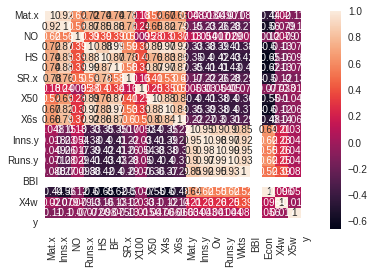

/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set 

TypeError: MathTextParser.parse() got an unexpected keyword argument 'antialiased'

<Figure size 432x288 with 2 Axes>

/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_affinity_propagation.py:142: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


Silhouette Score for K-Means: 0.49857751404833406


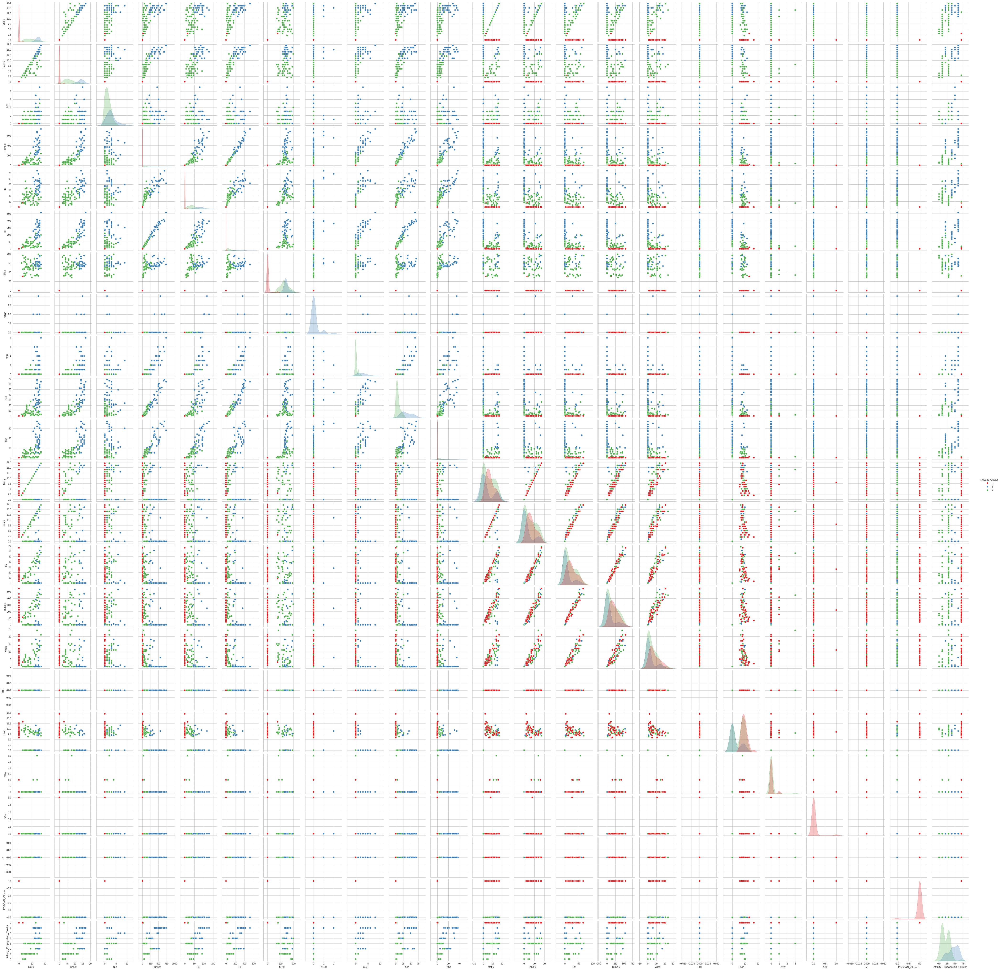

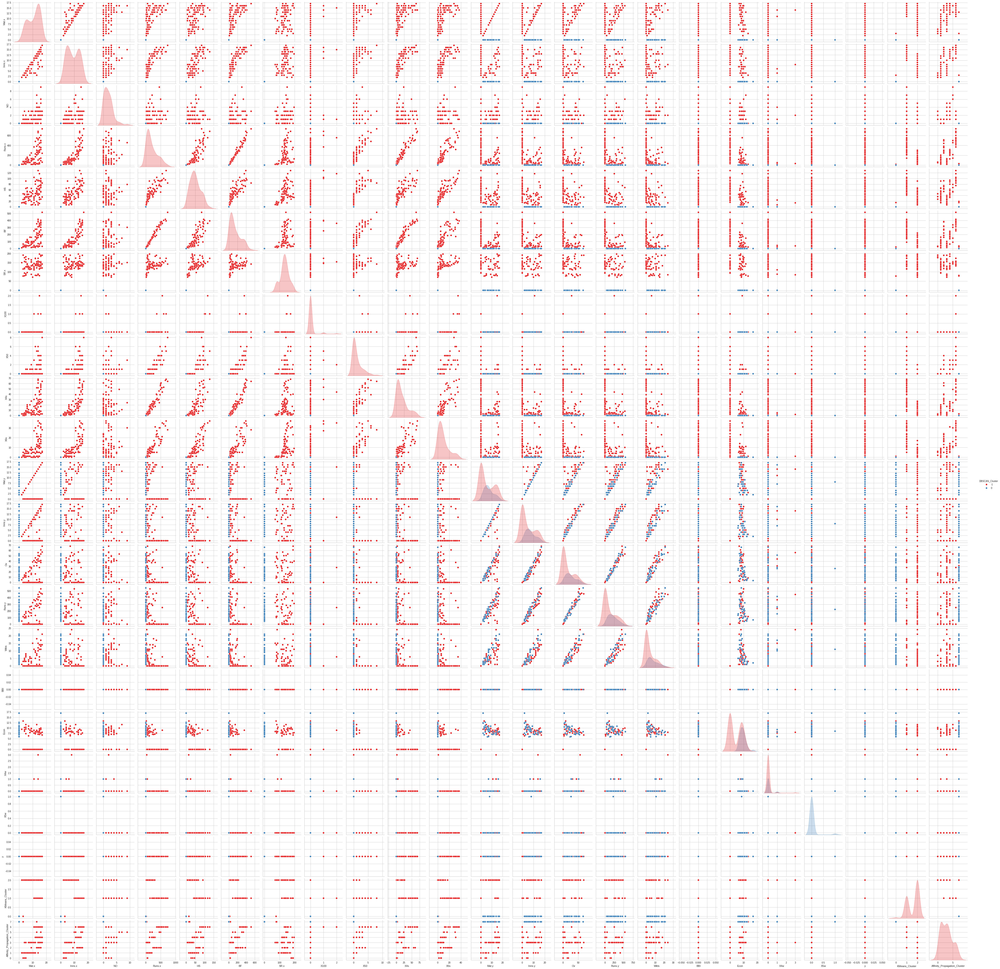

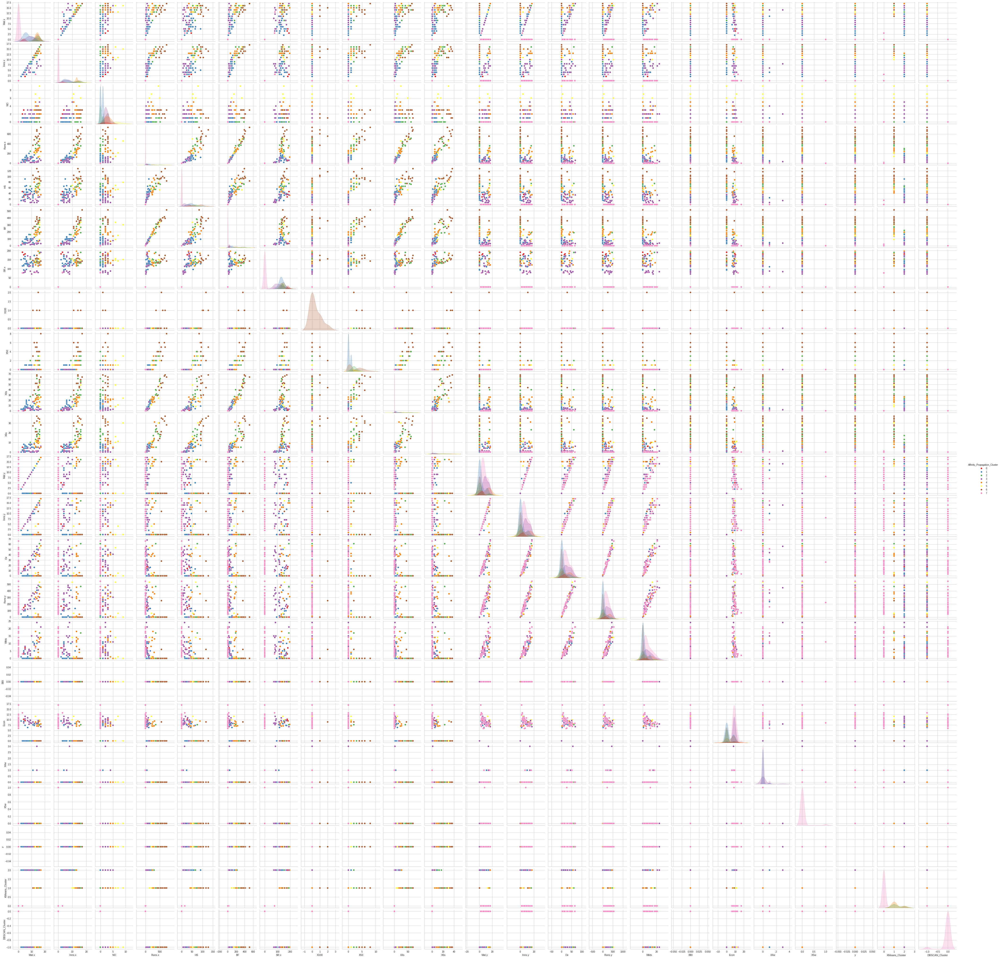

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from yellowbrick.cluster import KElbowVisualizer
from sklearn.metrics import silhouette_score
from sklearn.cluster import AffinityPropagation

# Load the dataset
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/total_data_na.csv")

# Replace "-" with NaN for non-numeric columns
non_numeric_columns = data.select_dtypes(exclude=[np.number]).columns
data[non_numeric_columns] = data[non_numeric_columns].replace('-', np.nan)

from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='mean')
scaled_data = imputer.fit_transform(scaled_data)

data.dropna(inplace=True)

# Data Analysis
# Check for basic statistics
print(data.describe())


# Correlation matrix
corr_matrix = data.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

# Clustering
# Feature selection and scaling
selected_features = data[['Inns.x', 'NO', 'Runs.x', 'HS', 'Avg.x', 'SR.x']]
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_features)

# Elbow method to find the optimal number of clusters for K-Means
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2, 10))
visualizer.fit(scaled_data)
visualizer.show()

# K-Means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
data['KMeans_Cluster'] = kmeans.fit_predict(scaled_data)

# DBSCAN
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(scaled_data)
distances, indices = nbrs.kneighbors(scaled_data)
distances = np.sort(distances, axis=0)[:, 1]
db = DBSCAN(eps=0.5, min_samples=5)
data['DBSCAN_Cluster'] = db.fit_predict(scaled_data)

# Affinity Popagation
affinity_propagation = AffinityPropagation()
data['Affinity_Propagation_Cluster'] = affinity_propagation.fit_predict(scaled_data)

# Silhouette Score for K-Means
silhouette_avg = silhouette_score(scaled_data, data['KMeans_Cluster'])
print(f"Silhouette Score for K-Means: {silhouette_avg}")

# Visualize the Clusters
sns.pairplot(data, hue="KMeans_Cluster", palette="Set1")
plt.show()

# Additional visualization for DBSCAN and Affinity Propagation
sns.pairplot(data, hue="DBSCAN_Cluster", palette="Set1")
plt.show()
sns.pairplot(data, hue="Affinity_Propagation_Cluster", palette="Set1")
plt.show()


/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


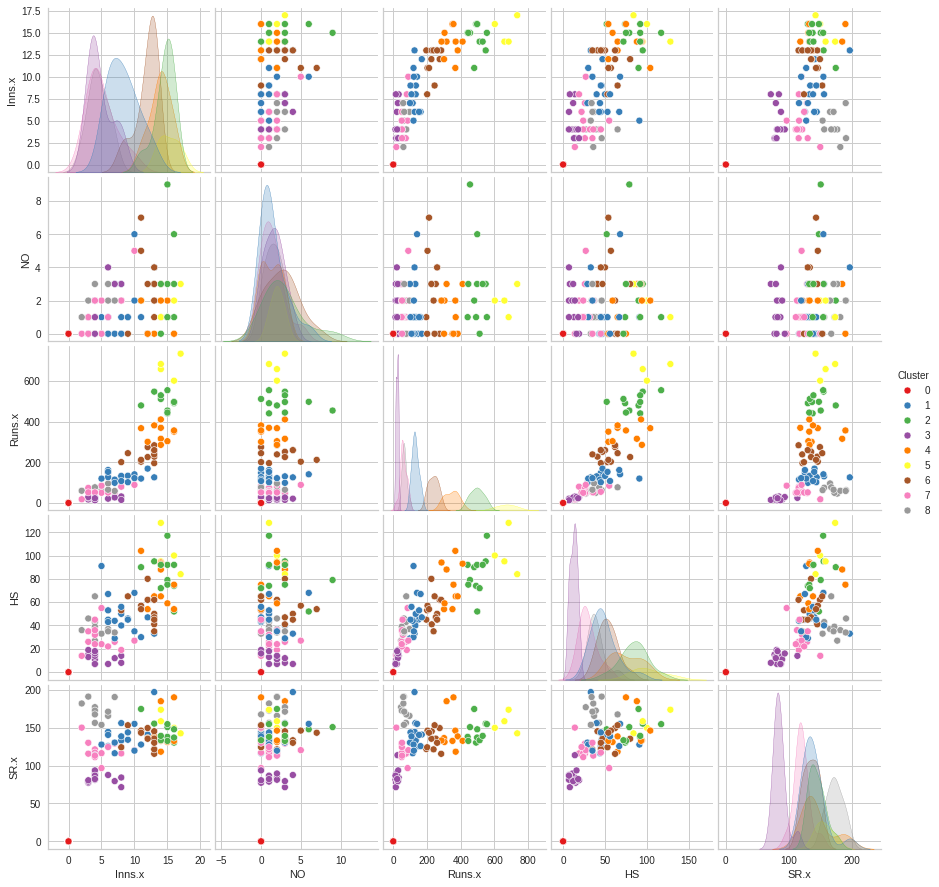

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors

# Load the dataset and preprocess the data
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/total_data_na.csv")
data = data.replace('-', np.nan)
data.dropna(inplace=True)

# Function to calculate varying epsilon for each data point
def calculate_varying_epsilon(X, k):
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(X)
    distances, indices = nbrs.kneighbors(X)
    return distances[:, -1]

# DBSCAN with varying epsilon using threshold-based approach
def dbscan_with_varying_epsilon(X, threshold, min_samples):
    varying_eps = calculate_varying_epsilon(X, min_samples)
    dbscan = DBSCAN(eps=threshold, min_samples=min_samples)
    dbscan.fit(X)
    return dbscan.labels_

# K-means clustering for points not in any DBSCAN cluster
def kmeans_for_noise_points(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(X)
    return kmeans.labels_

# Combine DBSCAN and K-means clustering
def combined_clustering(X, eps, min_samples, n_clusters_kmeans):
    dbscan_labels = dbscan_with_varying_epsilon(X, eps, min_samples)

    # Separate noise points for K-means clustering
    noise_points = X[dbscan_labels == -1]
    kmeans_labels_noise = kmeans_for_noise_points(noise_points, n_clusters_kmeans)

    # Merge K-means labels with DBSCAN labels
    final_labels = np.copy(dbscan_labels)
    final_labels[dbscan_labels == -1] = np.max(dbscan_labels) + 1 + kmeans_labels_noise

    return final_labels

# Define epsilon, min_samples, and K-means clusters
eps_best = 1.2
min_samples_best = 3
n_clusters_kmeans = 8  # Set this to a higher value to avoid limiting the clusters

# Perform combined clustering
X_numerics = data[['Inns.x', 'NO', 'Runs.x', 'HS', 'Avg.x', 'SR.x']]
cluster_labels = combined_clustering(X_numerics.values, eps_best, min_samples_best, n_clusters_kmeans)

# Create a DataFrame with cluster labels
DBSCAN_clustered = X_numerics.copy()
DBSCAN_clustered['Cluster'] = cluster_labels

# Plot clustering results
sns.pairplot(DBSCAN_clustered, hue="Cluster", palette="Set1")
plt.show()


In [21]:
data.head()

,PLAYER,Mat.x,Inns.x,NO,Runs.x,HS,Avg.x,BF,SR.x,X100,...,Ov,Runs.y,Wkts,BBI,Avg.y,Econ,SR.y,X4w,X5w,y
0,Aaron Finch,10,9,1,134,46,16.75,100,134.00,0,...,0.0,0,0,0,0,0.0,0,0,0,0
1,AB de Villiers,12,11,2,480,90,53.33,275,174.54,0,...,0.0,0,0,0,0,0.0,0,0,0,0
2,Abhishek Sharma,3,3,2,63,46,63,33,190.90,0,...,0.0,0,0,0,0,0.0,0,0,0,0
3,Ajinkya Rahane,15,14,1,370,65,28.46,313,118.21,0,...,0.0,0,0,0,0,0.0,0,0,0,0
4,Alex Hales,6,6,0,148,45,24.66,118,125.42,0,...,0.0,0,0,0,0,0.0,0,0,0,0


In [24]:
import pandas as pd

# Load the dataset
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/mushroom_csv.csv")

# Display the first few rows of the dataset
print(data.head())


  cap-shape cap-surface cap-color bruises%3F odor gill-attachment  \
0         x           s         n          t    p               f   
1         x           s         y          t    a               f   
2         b           s         w          t    l               f   
3         x           y         w          t    p               f   
4         x           s         g          f    n               f   

  gill-spacing gill-size gill-color stalk-shape  ... stalk-color-above-ring  \
0            c         n          k           e  ...                      w   
1            c         b          k           e  ...                      w   
2            c         b          n           e  ...                      w   
3            c         n          n           e  ...                      w   
4            w         b          k           t  ...                      w   

  stalk-color-below-ring veil-type veil-color ring-number ring-type  \
0                      w         p     

In [25]:
# Check for missing values
print(data.isnull().sum())

# Check data types
print(data.dtypes)

# Summary statistics
print(data.describe())


cap-shape                      0
cap-surface                    0
cap-color                      0
bruises%3F                     0
odor                           0
gill-attachment                0
gill-spacing                   0
gill-size                      0
gill-color                     0
stalk-shape                    0
stalk-root                  2480
stalk-surface-above-ring       0
stalk-surface-below-ring       0
stalk-color-above-ring         0
stalk-color-below-ring         0
veil-type                      0
veil-color                     0
ring-number                    0
ring-type                      0
spore-print-color              0
population                     0
habitat                        0
class                          0
dtype: int64
cap-shape                   object
cap-surface                 object
cap-color                   object
bruises%3F                  object
odor                        object
gill-attachment             object
gill-spacing      

In [27]:
!pip install --upgrade seaborn
!pip install --upgrade matplotlib



Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1 -> 23.2.1
[notice] To update, run: python3 -m pip install --upgrade pip
Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1 -> 23.2.1
[notice] To update, run: python3 -m pip install --upgrade pip


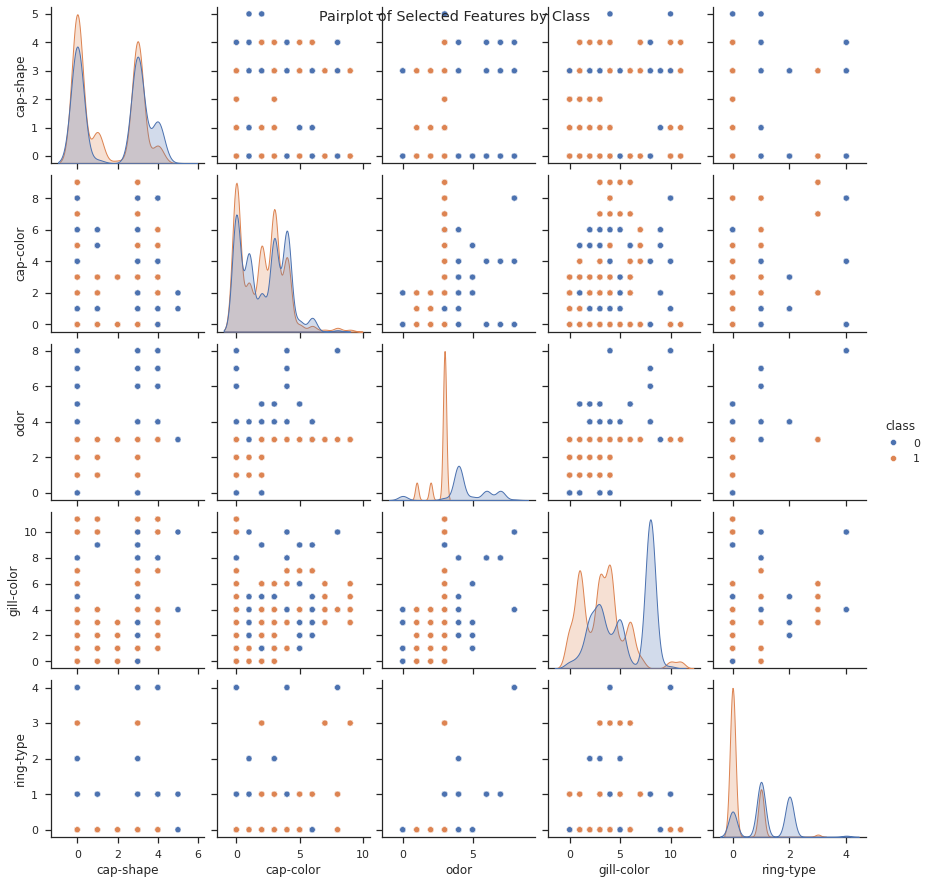

In [29]:
# Select some features for pairplot
selected_features = ["cap-shape", "cap-color", "odor", "gill-color", "ring-type", "class"]
data_selected = data[selected_features]

# Convert categorical columns to numerical for pairplot
data_selected_encoded = data_selected.apply(lambda x: pd.factorize(x)[0])

# Create pairplot
sns.set(style="ticks")
sns.pairplot(data_selected_encoded, hue="class")
plt.suptitle("Pairplot of Selected Features by Class")
plt.show()


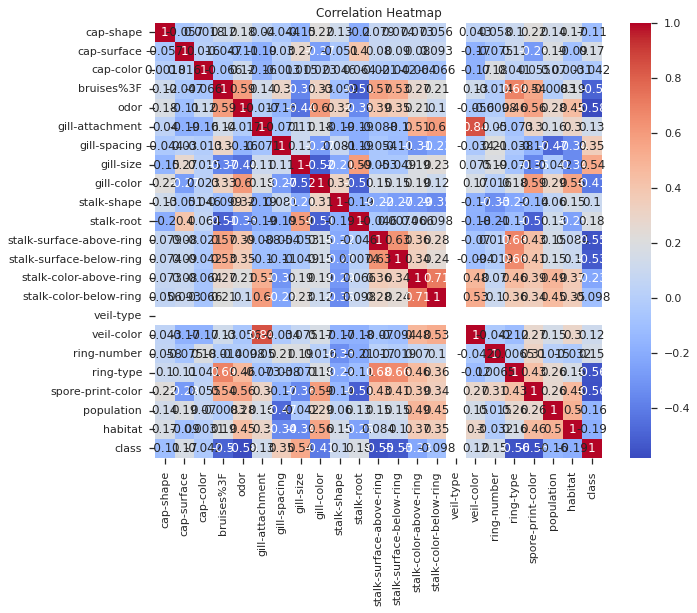

In [30]:
# Convert categorical columns to numerical for correlation matrix
data_encoded = data.apply(lambda x: pd.factorize(x)[0])

# Calculate the correlation matrix
corr_matrix = data_encoded.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


In [32]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/mushroom_csv.csv")

# Encode categorical features
label_encoders = {}
for column in data.columns:
    label_encoders[column] = LabelEncoder()
    data[column] = label_encoders[column].fit_transform(data[column])

# Feature selection and scaling
selected_features = data.drop(columns=["class"])
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_features)

# Function to calculate varying epsilon for each data point
def calculate_varying_epsilon(X, k):
    nbrs = NearestNeighbors(n_neighbors=k+1).fit(X)
    distances, indices = nbrs.kneighbors(X)
    return distances[:, -1]

# DBSCAN with varying epsilon using threshold-based approach
def dbscan_with_varying_epsilon(X, threshold, min_samples):
    varying_eps = calculate_varying_epsilon(X, min_samples)
    dbscan = DBSCAN(eps=threshold, min_samples=min_samples)
    dbscan.fit(X)
    return dbscan.labels_

# K-means clustering for points not in any DBSCAN cluster
def kmeans_for_noise_points(X, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(X)
    return kmeans.labels_

# Combine DBSCAN and K-means clustering
def combined_clustering(X, eps, min_samples, n_clusters_kmeans):
    dbscan_labels = dbscan_with_varying_epsilon(X, eps, min_samples)

    # Check if there are any noise points (labels of -1)
    if -1 in dbscan_labels:
        # Separate noise points for K-means clustering
        noise_points = X[dbscan_labels == -1]
        kmeans_labels_noise = kmeans_for_noise_points(noise_points, n_clusters_kmeans)

        # Merge K-means labels with DBSCAN labels
        final_labels = np.copy(dbscan_labels)
        final_labels[dbscan_labels == -1] = np.max(dbscan_labels) + 1 + kmeans_labels_noise
    else:
        final_labels = dbscan_labels

    return final_labels


# Define a range of epsilon and min_samples values to try
eps_values = [0.1, 0.5, 1.0, 1.5]
min_samples_values = [2, 3, 4, 5]

# Store the best silhouette score and corresponding parameters
best_silhouette_score = -1
best_eps = None
best_min_samples = None
best_cluster_labels = None

# Iterate through the epsilon and min_samples values
for eps in eps_values:
    for min_samples in min_samples_values:
        # Perform combined clustering
        cluster_labels = combined_clustering(scaled_data, eps, min_samples, n_clusters_kmeans)

        # Calculate silhouette score
        silhouette_avg = silhouette_score(scaled_data, cluster_labels)

        # Print and store the best silhouette score and parameters
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            best_eps = eps
            best_min_samples = min_samples
            best_cluster_labels = cluster_labels

# Print the best results
print(f"Best Silhouette Score: {best_silhouette_score}")
print(f"Best eps: {best_eps}")
print(f"Best min_samples: {best_min_samples}")

# Create a DataFrame with cluster labels
data["Cluster"] = best_cluster_labels

# Plot clustering results or perform any additional visualization as needed
# For example, you can plot cluster distributions or other relevant visualizations.

# Show the final plot
plt.show()


/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set 

Best Silhouette Score: 0.4170802006963599
Best eps: 1.0
Best min_samples: 2


/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/kts/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set 

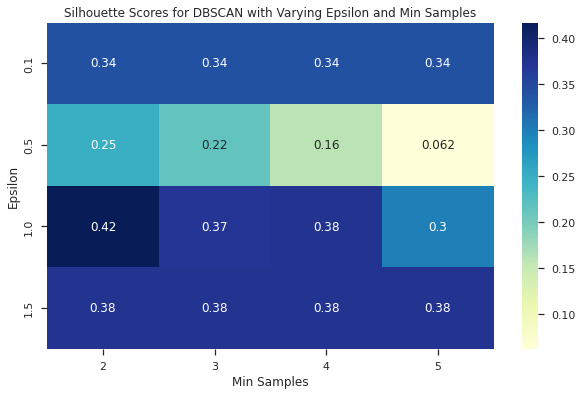

In [33]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv("/home/kts/Desktop/code/projects/machine learning/mushroom_csv.csv")

# Encode categorical features
label_encoders = {}
for column in data.columns:
    label_encoders[column] = LabelEncoder()
    data[column] = label_encoders[column].fit_transform(data[column])

# Feature selection and scaling
selected_features = data.drop(columns=["class"])
scaler = StandardScaler()
scaled_data = scaler.fit_transform(selected_features)

# Define a range of epsilon and min_samples values to try
eps_values = [0.1, 0.5, 1.0, 1.5]
min_samples_values = [2, 3, 4, 5]

# Create empty arrays to store silhouette scores
silhouette_scores = np.zeros((len(eps_values), len(min_samples_values)))

# Iterate through the epsilon and min_samples values
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        # Perform combined clustering
        cluster_labels = combined_clustering(scaled_data, eps, min_samples, n_clusters_kmeans)

        # Calculate silhouette score
        silhouette_avg = silhouette_score(scaled_data, cluster_labels)

        # Store the silhouette score
        silhouette_scores[i, j] = silhouette_avg

# Create a heatmap to visualize silhouette scores
plt.figure(figsize=(10, 6))
sns.heatmap(silhouette_scores, annot=True, xticklabels=min_samples_values, yticklabels=eps_values, cmap="YlGnBu")
plt.xlabel("Min Samples")
plt.ylabel("Epsilon")
plt.title("Silhouette Scores for DBSCAN with Varying Epsilon and Min Samples")
plt.show()
